<h1 style = 'text-align: center'><b>Lab 03: Generative Adversarial Networks</b></h1>

- Full name: Võ Nguyễn Hoàng Kim    
- Student ID: 21127090

<h2> <b>1. Mounted to Google Drive</b></h2>

In [1]:
# from google.colab import drive
drive.mount('/content/gdrive')

<h2><b>2. Import libraries</b></h2>

In [2]:
import torch
import torch.nn as nn
import torchvision.datasets
import torchvision.transforms as transforms
import torch.nn.functional as F
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt

<h2><b>3. Dataset</b></h2>

In [3]:
location_path = '/content/gdrive/MyDrive/Colab Notebooks'

# ToTensor: change PIL to Tensor, normalize [0, 255] -> [-1, 1]
myTransform =  transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5, ), (0.5, ))])

# download dataset MNIST and transform it
dataset =  torchvision.datasets.MNIST(root = "", transform = myTransform, download = True)

dataloader = torch.utils.data.DataLoader(dataset, batch_size=64, shuffle=True)

<h2><b>4. Construct the GAN model</b></h2>

<h3><b>4.1. Discriminator</b></h3>

In [4]:
# Define a small 2-layer FC neural network (one hidden layer) for Discriminator D
class Discriminator(nn.Module):
  def __init__(self, input_dim = 784):
    # gọi hàm khởi tạo của lớp cha (nn.Module)
    super(Discriminator, self).__init__()
    self.fc1 = nn.Linear(input_dim, 128)
    self.nonlin1 = nn.LeakyReLU(0.2)
    self.fc2 = nn.Linear(128, 1)

  def forward(self, x):
    # flatten (batch_size x 1 x 28 x 28) -> (batch_size x 784 )
    x = x.view(x.size(0), 784)

    # forward to FC1, apply activation LeakyReLU (self.nonlin1)
    # tensor h contains extracted feature 
    h = self.nonlin1(self.fc1(x))
    # forward to FC2, get the predict about real or fake image
    out = self.fc2(h)
    # apply sigmoid to normalize the result to [0,1]
    out = torch.sigmoid(out)
    return out


<h3><b>4.2. Generator</b></h3>

In [5]:
# define a small 2-layer neural network for Generator G
# (take a 100-dimension noise vector and generates an output of the size matching data)
class Generator(nn.Module):
  def __init__(self, z_dim = 100):
    super(Generator, self).__init__()
    self.fc1 = nn.Linear(z_dim, 128)
    self.nonlin1 = nn.LeakyReLU(0.2)
    self.fc2 = nn.Linear(128, 784)

  def forward(self, x):
    h = self.nonlin1(self.fc1(x))
    out = self.fc2(h)
    # range [-1, 1]
    out = torch.tanh(out)
    # convert to image
    out = out.view(out.size(0), 1, 28, 28)
    return out

<h3><b>4.3. Loss function</b></h3>

In [ ]:
# check the using device 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print('Device: ', device)

D = Discriminator().to(device)
G = Generator().to(device)

# set up the optimizers for Discriminator and Generator
# Using SGD for the optimizer
optimizerD = torch.optim.SGD(D.parameters(), lr = 0.03)
optimizerG = torch.optim.SGD(G.parameters(), lr = 0.03)

# Using Adam for the optimizer
# optimizerD = torch.optim.Adam(D.parameters(), lr = 0.0002)
# optimizerG = torch.optim.Adam(G.parameters(), lr = 0.0002)


# define loss function BCE
criterion = nn.BCELoss()
batch_size = 64
lab_real = torch.ones(batch_size, 1).to(device)
lab_fake = torch.zeros(batch_size, 1).to(device)

<h2><b>5. Train model</b></h2>

In [7]:
# train models G and D on dataset
epoch_num = 100
img_list = []
G_losses = []
D_losses = []
iters = 0

for epoch in range(epoch_num):
  for i,data in enumerate(dataloader, 0):
    # Step1: Discriminator optimization step
    x_real, _ = next(iter(dataloader))
    x_real = x_real.to(device)
    # reset accumulation gradients from previous iteration
    optimizerD.zero_grad()

    D_x = D(x_real)
    lossD_real = criterion(D_x, lab_real)

    z = torch.randn(64, 100, device=device)   # random noise, 64 samples, z-dim=100
    x_gen = G(z).detach()
    D_G_z = D(x_gen)
    lossD_fake = criterion(D_G_z, lab_fake)

    lossD = lossD_real + lossD_fake
    lossD.backward()
    optimizerD.step()

    # Step2: Generator optimization step
    # reset accumulation gradients from previous iteration
    optimizerG.zero_grad()

    z = torch.randn(64, 100, device = device)     # random noise,64 samples, z-dim=100
    x_gen = G(z)
    D_G_z = D(x_gen)
    lossG = criterion(D_G_z, lab_real)        # -log(D(G(z)))

    lossG.backward()
    optimizerG.step()

    if i == len(dataloader) - 1:
      print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'% (epoch, epoch_num, i, len(dataloader), lossD.item(), lossG.item()))

    # Save Losses for plotting later
    G_losses.append(lossG.item())
    D_losses.append(lossD.item())

    # Check how the generator is doing by saving G's output on fixed_noise
    if (iters % 500 == 0) or ((epoch == epoch_num-1) and (i == len(dataloader)-1)):
        with torch.no_grad():
            fake = G(z).detach().cpu()
        img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

    iters += 1


[0/100][937/938]	Loss_D: 1.0271	Loss_G: 2.9923
[1/100][937/938]	Loss_D: 1.0063	Loss_G: 0.6714
[2/100][937/938]	Loss_D: 0.8260	Loss_G: 1.9112
[3/100][937/938]	Loss_D: 0.9916	Loss_G: 2.1098
[4/100][937/938]	Loss_D: 0.9257	Loss_G: 2.3510
[5/100][937/938]	Loss_D: 0.7642	Loss_G: 1.0245
[6/100][937/938]	Loss_D: 0.9488	Loss_G: 0.7589
[7/100][937/938]	Loss_D: 0.8781	Loss_G: 0.8388
[8/100][937/938]	Loss_D: 1.4647	Loss_G: 0.4270
[9/100][937/938]	Loss_D: 0.9449	Loss_G: 1.9854
[10/100][937/938]	Loss_D: 1.3377	Loss_G: 0.5510
[11/100][937/938]	Loss_D: 1.0151	Loss_G: 0.6103
[12/100][937/938]	Loss_D: 0.9748	Loss_G: 2.7991
[13/100][937/938]	Loss_D: 1.1463	Loss_G: 2.7540
[14/100][937/938]	Loss_D: 0.9895	Loss_G: 2.5048
[15/100][937/938]	Loss_D: 0.9129	Loss_G: 0.8773
[16/100][937/938]	Loss_D: 1.1029	Loss_G: 1.9934
[17/100][937/938]	Loss_D: 0.9556	Loss_G: 2.1723
[18/100][937/938]	Loss_D: 1.1457	Loss_G: 0.6867
[19/100][937/938]	Loss_D: 0.7934	Loss_G: 1.5364
[20/100][937/938]	Loss_D: 1.1115	Loss_G: 0.5093
[2

<h3><b>5.1 Plot loss value</b></h3>

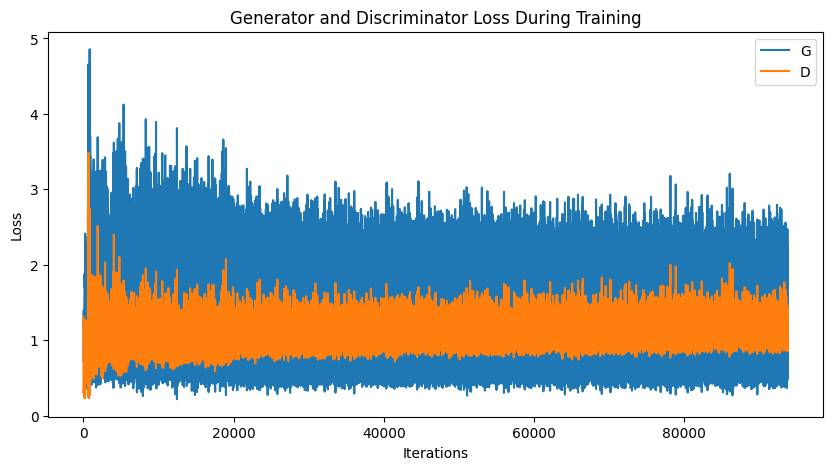

In [8]:
# Plot loss values
plt.figure(figsize=(10,5))
plt.plot(G_losses, label="G")
plt.plot(D_losses, label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Generator and Discriminator Loss During Training")
plt.legend()
plt.show()

<h3><b>5.2. Plot result to compare</b></h3>

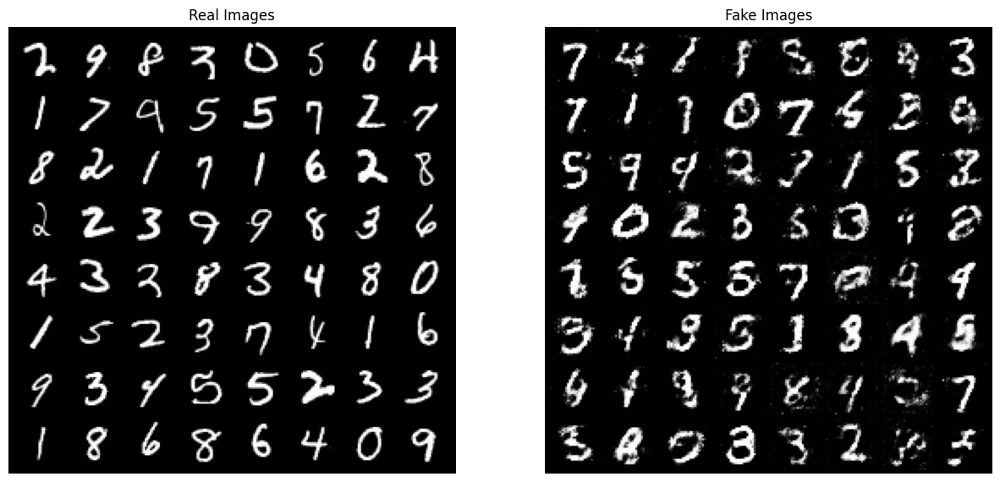

In [9]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

<h3><b>5.3. Plot image during training process</b></h3>

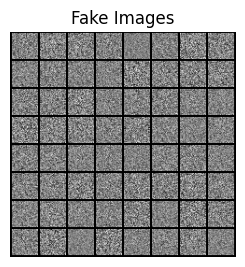

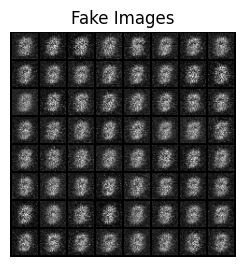

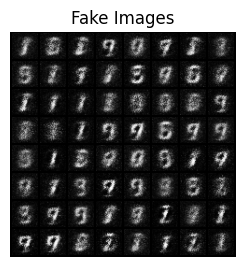

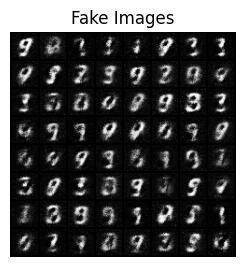

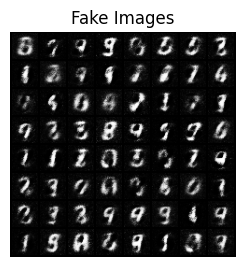

...

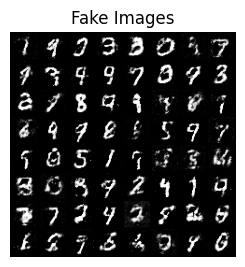

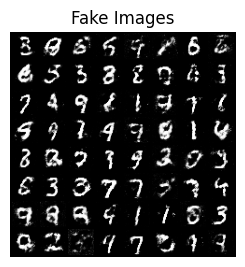

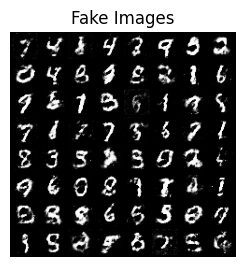

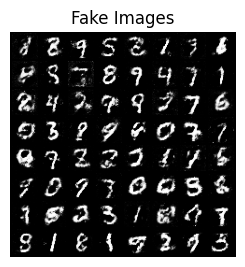

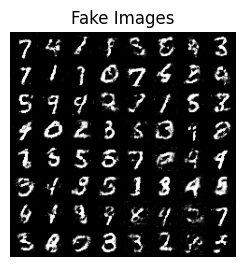

In [10]:
# plot the fake image during training process
def plot(i):
  plt.subplot(1,2,2)
  plt.axis("off")
  plt.title("Fake Images")
  plt.imshow(np.transpose(img_list[i],(1,2,0)))
  plt.show()

for i in range(len(img_list)):
  plot(i)